# Assignment 2
### Requirements
It should run normally in the conda python 3.11 environment, as I have not imported anything from outside the MCT4052 notebook.
### Summary
(Note: Ive repeated some of this further down in the code, as ive written down my thoughts where they "happen". But this is a summary of many of my thoughts to give a more holistic understanding of my thoughts)

My original thought was to try to create clusters in a dataset with synths and accoustic samples. Ive added some acoustic sounds to the daaset the group worked on. I realize that its probably not enough samples, and having a single note, for each note (c2, c3, c4) wasnt really giving any distinct differences in results. I tried experimenting and filtering out only one "note" at the time, using only the c2 to compare with, but I didnt really have a success with this strategy, so I decided to mostly use the whole dataset to try to see what would come out from clustering, which i think was good, as a low freq. bell sounds quite different than a high-freq bell. All in all, I think the clustering results has something to them, listening to the different clusters, I do find similarities inside each cluster. 

Like a bell can sound more like a piano, and a synth can sound more like a bell like -> ""./Audio/synth-pluck-14-massive-dynamic-stage-c3.wav" (See cluster 7 at bottom (0 indexed)).

I found most success with having 8 clusters.
As I have used KMeans for Clustering, which is a unsupervised algorithm, I dont really need the classes, but when i tried having 8 clusters, I wanted to see if they somehow concided with the two first labels of the datasets. I visualize this after the first dimensional reduction, where its clear that theres a lot of overlap between the labels, which does not overlap with the 8 clusters after KMeans fitting. This is fine, as this isnt a classification task, but the question remains to see if these clusters do have some similarities or if its just nonesense. When listening to each cluster, I have written down these experiences:

Nr 7: Short, high-pitched bell similar sound.

Nr 6: Longer, more airy (noisy) bells-ish-sound, including some high-pitched synths and noisy elements.

Nr 5: Consists of massive synthesizers. (Very noisy)

Nr 4: Appears to be a mix of different sounds.

Nr 3: Features clean, hard-hitting sounds.

Nr 2: Comprises pads and similar mellow piano sounds (some light airy noise).

Nr 1: Characterized by low pitch, high attack, plucks, and noise with stable sound.

Nr 0: Contains high-pitched sounds.

My music theory understanding is a little lacking for thoroughly explain why I have chosen the features I have chosen, but after reading "https://sessionville.com/articles/timbre-understanding-and-manipulating-texture", I figured the looking at the frequency spectrum and using the different libraries regarding this would be fitting. I tried changing a using some different features, but found most consistent results with the 7 I picked. Let me know if I should delve further into this/you have feedback of how to do it better.




In [1]:
import numpy as np
import pandas as pd
import librosa, librosa.display
import matplotlib.pyplot as plt
import matplotlib.style as ms
#ms.use("seaborn-v0_8") 
import IPython.display as Ipd
import os



#import scikit-learn
import sklearn

%matplotlib widget
%config IPCompleter.greedy=True

In [2]:
sr = 22050

#Instead of writing the code to extract the features we define a function,
#which is more elegant, it's reusable (shorter code) and makes the following code more readable.
#All features are from librosa and are all scalar (we take the mean over multiple blocks computed across the duration, which differs for each file).
#The function returns a list containing the mean of the features given an filename, and the sampling rate at which we are resampling the file
#Mind that these features may not be the best to perform the classification task (it's just an example!)
def extract_features(filename, sr):
    # Load the audio file
    signal, _ = librosa.load(filename, sr=sr, mono=True)
    
    # Extract features
    output = [
        np.mean(librosa.feature.zero_crossing_rate(y=signal)),
        np.mean(librosa.feature.spectral_centroid(y=signal, sr=sr)),
        np.mean(librosa.feature.spectral_contrast(S=np.abs(librosa.stft(signal)), sr=sr)),
        np.mean(librosa.feature.spectral_flatness(y=signal)),
        np.mean(librosa.feature.spectral_bandwidth(y=signal, sr=sr)),
        np.mean(librosa.feature.spectral_rolloff(y=signal, sr=sr)),
    ]
    
    return output


#creating an array of zeros of the proper size where we will store computed features and lables
filenames = os.listdir('./Audio')
filenames_c2 = [f for f in filenames if 'c2' in f] # I just removed _c2 and called this filenames, while renamed the one over filenamesx for easiest switching
features = np.zeros((len(filenames),6)) #we compute the average of 6 features in the above code
labels = np.zeros((len(filenames))) #we store the labels as integers
classes = ['synth-lead','synth-keys','synth-flute','synth-bell','synth-pluck','synth-pad','synth-keys','acc-keys', 'acc-pluck'] # Just examples i thought could be relevant

for i in range(len(filenames)):
    print('processing',filenames[i])
    features[i,:] = extract_features('./Audio/'+filenames[i], sr)
    if filenames[i].find('synth-lead') != -1:
        labels[i] = 0
    elif filenames[i].find('synth-keys') != -1:
        labels[i] = 1
    elif filenames[i].find('synth-flute') != -1:
        labels[i] = 2
    elif filenames[i].find('synth-bell') != -1:
        labels[i] = 3
    elif filenames[i].find('synth-pluck') != -1:
        labels[i] = 4
    elif filenames[i].find('synth-pad') != -1:
        labels[i] = 5
    elif filenames[i].find('synth-keys') != -1:
        labels[i] = 6
    elif filenames[i].find('acc-keys') != -1:
        labels[i] = 7
    elif filenames[i].find('acc-pluck') != -1:
        labels[i] = 8


print('Done!')
print(features.shape)

processing synth-pluck-20-prism-gingerfizz-c2.wav
processing synth-keys-2-massive-angkluster-c3.wav
processing acc_keys_14_mellow_piano_c3.wav
processing synth-flute-18-massive-bansuri-c3.wav
processing synth-flute-24-massive-thewhistler-c3.wav
processing synth-keys-24-prism-clamshell-c2.wav
processing synth-bell-02-prism-keybells-c4.wav
processing synth-pluck-21-prism-razorback-c3.wav
processing synth-bell-06-prism-kulintang-c4.wav
processing acc_pluck_11_el_lespaul_c3.wav
processing synth-keys-1-massive-analogue-dreams-c3.wav
processing synth-flute-13-steampipe-organ2-c3.wav
processing synth-keys-1-massive-analogue-dreams-c2.wav
processing synth-flute-8-steampipe-pan-c4.wav
processing synth-pluck-21-prism-razorback-c2.wav
processing synth-flute-11-steampipe-steampipe-c3.wav
processing synth-keys-18-prism-halflight-c4.wav
processing synth-keys-24-prism-clamshell-c3.wav
processing synth-flute-24-massive-thewhistler-c2.wav
processing synth-flute-7-steampipe-flute-c3.wav
processing synth

# Split dataset

In [3]:
from sklearn.model_selection import train_test_split

#splitting the dataset in training and testing parts
feat_train, feat_test, lab_train, lab_test = train_test_split(features, labels, test_size=0.2, random_state=77)

# Scaler
This step is crucial because K-means clustering is sensitive to the scale of the data. Features on larger scales can dominate the distance metrics used by K-means, leading to biased clusters. 

I tried looking a the features in the 3 plot just too see 

In [4]:
from sklearn.preprocessing import StandardScaler

#learning the scaling transformation from the train data and applying it to both train and test set.

#creating scaling object
scaler = StandardScaler()

#learning scaling from train set
scaler.fit(feat_train)

#applying scaling to both train and test set
feat_train = scaler.transform(feat_train)
feat_test = scaler.transform(feat_test)

Text(0.5, 0, 'norm spect flat')

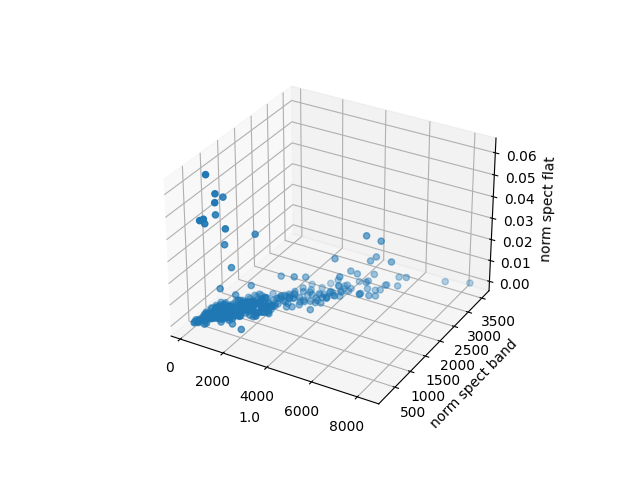

In [5]:
# displaying the features on 3D scatter plot    
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.scatter3D(features[:,5], features[:,4], features[:,3])
ax.set_xlabel(labels[5])
ax.set_ylabel('norm spect band')
ax.set_zlabel('norm spect flat')

# Fit
To make the data ready dimentionality reduction.

Also, I just wanted to see if the classes matched the clustering. (They did not).

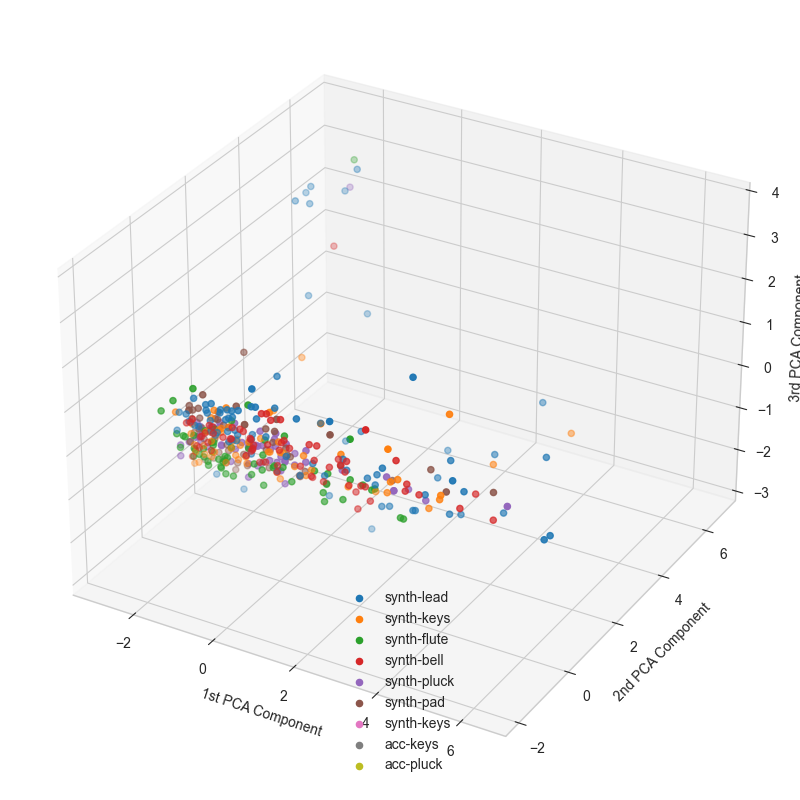

In [6]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # This is necessary for 3D plotting

# Assuming feat_train, feat_test, scaler, features, and labels are defined
# and that PCA and data preprocessing have already been done as per your description

# Initialize PCA and transform features
pca = PCA()
pca.fit(feat_train)  # Learning PCA projection from train data
projected_features_train = pca.transform(feat_train)
projected_features_test = pca.transform(feat_test)
projected_features = pca.transform(scaler.transform(features))  # For all data

# Plotting in 3D
with plt.style.context('seaborn-whitegrid'):
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, projection='3d')  # Create a 3D subplot
    
    for lab_val, lab_name in zip(range(len(classes)), classes):
        ax.scatter(projected_features[labels == lab_val, 0],  # X-axis: 1st PCA component
                   projected_features[labels == lab_val, 1],  # Y-axis: 2nd PCA component
                   projected_features[labels == lab_val, 2],  # Z-axis: 3rd PCA component
                   label=lab_name)
    
    ax.set_xlabel('1st PCA Component')
    ax.set_ylabel('2nd PCA Component')
    ax.set_zlabel('3rd PCA Component')
    ax.legend(loc='lower center')
    plt.tight_layout()
    plt.show()


# Removing outliers

In [7]:
from sklearn.cluster import DBSCAN

# Initialize DBSCAN
dbscan = DBSCAN(eps=2, min_samples=5)  # I Adjusted these parameters to find outliers

# Fit DBSCAN on the PCA-tran
# sformed features
dbscan_labels = dbscan.fit_predict(projected_features)  # Using full dataset PCA projections

# Identify outliers (labelled as -1)
outliers = dbscan_labels == -1

# Retrieve filenames of outliers using boolean indexing
outlier_filenames = np.array(filenames)[outliers]

print("Outlier Files:")
for fname in outlier_filenames:
    print(fname)


Outlier Files:
synth-lead-24-monark-borehole-c4.wav
synth-keys-6-massive-cascaded-timeslots-c3.wav


# Dimension reduction
I want to reduce the dimention before I do the KNN-clustering

PCA can help to reduce the feature space to a manageable size while retaining most of the variance in the data.

In [8]:
# keeping a lower number of dimensions
num_of_dim95 = np.min(np.where(np.cumsum(pca.explained_variance_ratio_)>0.95)) + 1

print(num_of_dim95)

# dimension before
print(projected_features_train.shape)
print(projected_features_test.shape)

# keeping only a number of components (columns, or features) carryinng 95% of total variance
projected_features_train = projected_features_train[:,0:num_of_dim95]
projected_features_test = projected_features_test[:,0:num_of_dim95]

# dimension after, reduced from 7 to 5
print(projected_features_train.shape)
print(projected_features_test.shape)

4
(312, 6)
(78, 6)
(312, 4)
(78, 4)


# Find clusters
Want to find the "elbow" to choose the best value for K. Its not that clear in this dataset what would be the best number for me, as theres not a clear elbow, but I originally thought that is was resonable to put it around 3-6, but after some experimenting, i found that 8 gave the best results. I first only had 2 classes, acc for acoustic, and synth for synths, as I thought maybe I could find it could match the clusters. 
I 

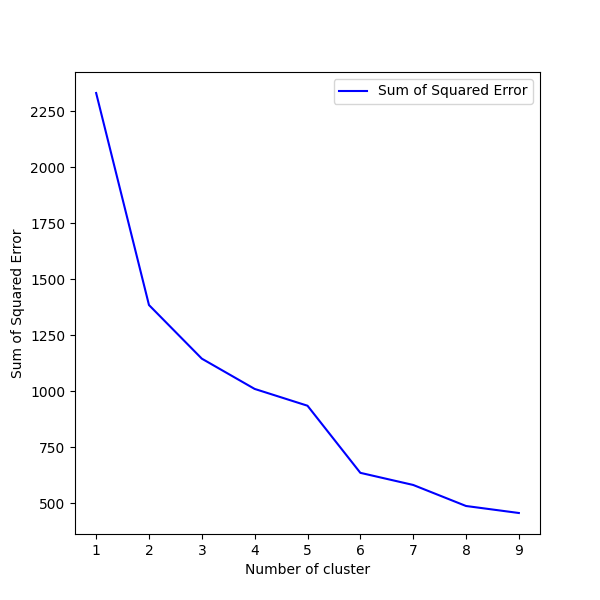

In [9]:
from sklearn.cluster import KMeans

sse = [] #sum of squared errors

range_n_clusters = range(1, 10)

for k in range_n_clusters:
    kmeans = KMeans(n_clusters=k, n_init='auto', max_iter=1000).fit(projected_features)
    
    sse.append(kmeans.inertia_) # Inertia: Sum of distances of samples to their closest cluster center
         
fig = plt.figure(figsize=(6,6))
plt.plot(range_n_clusters, sse,'b-',label='Sum of Squared Error')
plt.xlabel("Number of cluster")
plt.ylabel("Sum of Squared Error")
plt.legend()

# Cluster
Choosing the value for k, and fitting the data. I experimented with clusters 3-6 mostly, before finding most success with 8. When listening to each of the clusters then, I feel like I could hear similarities in each cluster. 

In [10]:
from sklearn.cluster import KMeans

#Working whit 8 clusters
clusters = 3

kmeans = KMeans(n_clusters=clusters, random_state=1, n_init=10)

#we are using features 
kmeans = kmeans.fit(projected_features)

#this will generate labels as integer numbers ranging from 0 to number of clusters -1
predicted_labels = kmeans.predict(projected_features)

Text(0.5, 0, '3rd component')

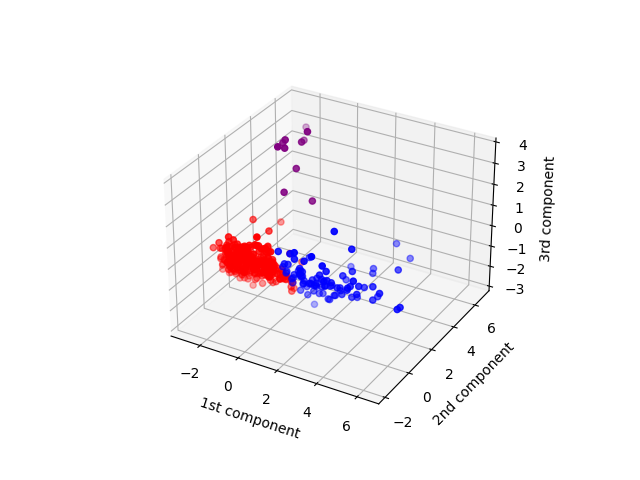

In [11]:
fig = plt.figure()
ax = plt.axes(projection='3d')

colors = ['blue', 'red', 'purple', 'green', 'orange', 'pink', 'yellow', 'black', ] #the lenght of this liste must be equal or greater the number of clusters

for lab_val, col in zip(range(0,clusters),colors):
    ax.scatter3D(projected_features[predicted_labels==lab_val, 0],
                 projected_features[predicted_labels==lab_val, 1],
                 projected_features[predicted_labels==lab_val, 2], 
                 c=col)

ax.set_xlabel('1st component')
ax.set_ylabel('2nd component')
ax.set_zlabel('3rd component')

k = 3
When listening I have noticed these categories:


Nr 2: Characterized by high attack, mostly pluck sounds, mid frequency spectrum.

Nr 1: Characterized by (mostly) low pitch, high attack, plucks, and noise with stable sound. Most sounds are very "airy"

Nr 0: Contains high-pitched frequencies. Clean or buzzy (saw) frequensies like sounds.

In [12]:
#Selecting which class (an integer from 0 to number of cluster - 1) to be "displayed",
#in the Audio widgets below
selected_cluster = 0
selected_cluster_idxs = np.asarray(np.where(predicted_labels == selected_cluster)).flatten()

for i in range(np.size(selected_cluster_idxs)):
    print('./Audio/'+filenames[selected_cluster_idxs[i]])
    signal, sr = librosa.load('./Audio/'+filenames[selected_cluster_idxs[i]], sr=sr, mono=True, offset= 0, duration=3)
    Ipd.display(Ipd.Audio(signal, rate=sr))

./Audio/synth-bell-02-prism-keybells-c4.wav


./Audio/synth-bell-06-prism-kulintang-c4.wav


./Audio/synth-keys-18-prism-halflight-c4.wav


./Audio/synth-bell-16-prism-polanski-c4.wav


./Audio/synth-lead-24-monark-borehole-c4.wav


./Audio/synth-flute-21-massive-massflute-c4.wav


./Audio/synth-lead-22-monark-squarish-c4.wav


./Audio/synth-bell-17-prism-prismchime-c4.wav


./Audio/synth-bell-05-prism-milkcan-c2.wav


./Audio/synth-lead-8-massive-blender-c3.wav


./Audio/synth-keys-24-prism-clamshell-c4.wav


./Audio/synth-pad-11-massive-reefpool-c3.wav


./Audio/acc_pluck_10_el_lespaul_c2.wav


./Audio/synth-flute-24-massive-thewhistler-c4.wav


./Audio/synth-lead-8-massive-blender-c2.wav


./Audio/synth-bells-massive-arctic-bells-c3.wav


./Audio/synth-lead-22-monark-squarish-c3.wav


./Audio/synth-lead-24-monark-borehole-c2.wav


./Audio/synth-lead-24-monark-borehole-c3.wav


./Audio/synth-bell-16-prism-polanski-c3.wav


./Audio/synth-lead-22-monark-squarish-c2.wav


./Audio/synth-keys-4-massive-blue-lagoon-c3.wav


./Audio/synth-bell-14-prism-lumphammer-c4.wav


./Audio/synth-pluck-26-prism-cera-c4.wav


./Audio/synth-lead-2-massive-alovelead-c3.wav


./Audio/synth-flute-17-massive-amsterdamned-c4.wav


./Audio/synth-keys-7-massive-cruithne_s-orbit-c2.wav


./Audio/synth-bell-21-prism-baroque-c4.wav


./Audio/synth-keys-9-massive-crystals-c2.wav


./Audio/synth-keys-17-massive-going-to-california-c3.wav


./Audio/synth-keys-9-massive-crystals-c3.wav


./Audio/synth-bell-24-prism-alloy-c4.wav


./Audio/synth-flute-17-massive-amsterdamned-c3.wav


./Audio/synth-flute-17-massive-amsterdamned-c2.wav


./Audio/synth-lead-18-fm8-movethewheel-c3.wav


./Audio/synth-lead-17-fm8-modwheel-c2.wav


./Audio/synth-lead-4-massive-analogica-c3.wav


./Audio/synth-lead-7-massive-biglead-c2.wav


./Audio/synth-keys-6-massive-cascaded-timeslots-c2.wav


./Audio/synth-keys-6-massive-cascaded-timeslots-c3.wav


./Audio/synth-lead-7-massive-biglead-c3.wav


./Audio/synth-lead-4-massive-analogica-c2.wav


./Audio/synth-lead-17-fm8-modwheel-c3.wav


./Audio/synth-bell-21-prism-baroque-c3.wav


./Audio/synth-keys-11-massive-delay-lines-c3.wav


./Audio/synth-lead-15-fm8-krasious-c3.wav


./Audio/synth-bell-13-prism-chimelion-c4.wav


./Audio/synth-flute-16-prism-flutypad-c4.wav


./Audio/acc_pluck_6_steel_guitar_c4.wav


./Audio/synth-pad-21-prism-ancientpipes-c4.wav


./Audio/synth-pad-20-prism-artificialvoice-c4.wav


./Audio/synth-bell-15-prism-bigbenny-c3.wav


./Audio/acc_pluck_9_acoustic_guitar_c4.wav


./Audio/synth-lead-12-spark-messiv-c3.wav


./Audio/synth-lead-10-massive-buzzlightyear-c3.wav


./Audio/synth-bell-15-prism-bigbenny-c4.wav


./Audio/synth-pluck-5-massive-flexural-c3.wav


./Audio/synth-pluck-5-massive-flexural-c2.wav


./Audio/synth-pad-20-prism-artificialvoice-c3.wav


./Audio/synth-lead-10-massive-buzzlightyear-c2.wav


./Audio/synth-keys-20-prism-brokenpiano-c4.wav


./Audio/synth-keys-16-massive-go-to-clav-c2.wav


./Audio/synth-lead-6-massive-bigbenders-c2.wav


./Audio/synth-lead-23-monark-zen-c4.wav


./Audio/synth-pluck-13-spark-carriere-c3.wav


./Audio/synth-pluck-18-prism-lazerguitar-c4.wav


./Audio/synth-flute-25-prism-ethnicflute-c4.wav


./Audio/synth-keys-16-massive-go-to-clav-c3.wav


./Audio/synth-flute-19-massive-burstedflute-c4.wav


./Audio/synth-bell-08-prism-oldopera-c4.wav


./Audio/synth-lead-5-massive-babylon-c3.wav


./Audio/synth-lead-5-massive-babylon-c2.wav


./Audio/synth-pluck-19-prism-djangle-c4.wav


./Audio/synth-flute-25-prism-ethnicflute-c3.wav


./Audio/synth-lead-1-massive-99reese-c2.wav


./Audio/synth-pad-14-massive-white-c2.wav


./Audio/synth-lead-3-massive-anair-c2.wav


./Audio/synth-bell-04-prism-silverbowl-c4.wav


./Audio/synth-lead-3-massive-anair-c3.wav


./Audio/synth-bell-11-prism-tubular1-c4.wav


./Audio/synth-pad-14-massive-white-c3.wav


./Audio/synth-lead-1-massive-99reese-c3.wav


./Audio/synth-keys-25-prism-partialpiano-c4.wav


./Audio/synth-pluck-19-prism-djangle-c3.wav


./Audio/synth-bell-08-prism-oldopera-c2.wav


./Audio/synth-flute-22-massive-orientsaw-c4.wav


./Audio/synth-bell-20-prism-strike-c4.wav


./Audio/synth-bell-08-prism-oldopera-c3.wav


./Audio/synth-bell-03-prism-gravitas-c4.wav


./Audio/synth-pluck-19-prism-djangle-c2.wav


./Audio/synth-bell-12-prism-tubular2-c4.wav


In [13]:
#computing scores (output is in range 0 to 1 where 1 is best)

# Doesnt really give good scores, but as the discussed the labels isnt relating to the clustering
print('V Measure Score:',sklearn.metrics.v_measure_score(labels, predicted_labels))
print('Homogeneity Score:',sklearn.metrics.homogeneity_score(labels, predicted_labels))
print('Completeness Score:',sklearn.metrics.completeness_score(labels, predicted_labels))


V Measure Score: 0.04301295389011163
Homogeneity Score: 0.029526027200421263
Completeness Score: 0.07918160034474578
